In [1]:
import os
import pandas
#import wordcloud
import nibabel as nb
import nilearn.plotting as plotting
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from scipy import stats
from matplotlib.colors import Normalize
from scipy.spatial.distance import pdist, cdist
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import MinMaxScaler
#from brainsmash.mapgen.base import Base
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.metrics import normalized_mutual_info_score, adjusted_mutual_info_score, adjusted_rand_score
from sklearn.cluster import AgglomerativeClustering
#from netneurotools.datasets import fetch_cammoun2012
from neuromaps.datasets import fetch_atlas, available_annotations, fetch_annotation

# annoyingly, you'll need to clone the git repo from my previous paper because I 
# recycle some code from that repo.
# https://github.com/illdopejake/Hippocampus_AP_Axis

# change this to the location of that repo
import sys
sys.path.insert(0,'../Hippocampus_AP_Axis/')
import HAP_Utils as hap

# Explanation
This notebook seeks to replicate the cortical surface analysis, but creating gradients using *only* cortical samples (instead of whole-brain samples). This will test the hypothesis that gradients seen in the cortex are actually just cortical extension of whole-brain gradients

# Refit the model using cortex only information

In [2]:
# Generated in NB1
bigdf = pandas.read_csv('data/expression.csv') 
allendir = '~/abagen-data/microarray/'
probes = pandas.read_csv(os.path.join(allendir,'normalized_microarray_donor10021/Probes.csv'))
# Generated in NB2
gdf = pandas.read_csv('data/PLS_GXp_gdf.csv',index_col=0) # Generated in NB2
bigdf.index = gdf.index
bigdf.drop('well_id',axis=1,inplace=True)

In [15]:
g = pandas.read_csv('data/MAIN_gcx_wholebrain_info_W_BRAIN_DIVISIONS.csv',index_col=1)
g.drop(g.columns[0],axis=1,inplace=True)
g = g.loc[gdf.index]
g.brain_divison.value_counts()

Temporal               568
Frontal                405
Limbic                 269
Cerebellum             256
Medulla                245
Thalamus               225
Sensorimotor           215
Striatum               202
Parietal               193
Occipital              170
Pons                   142
Tegmentum              142
Anterior_Cingulate      99
Insula                  91
Hypothalamus            69
Posterior_Cingulate     57
Forebrain               47
DCN                     29
Other_Dien              28
Tectum                  12
Name: brain_divison, dtype: int64

In [16]:
# only use the cerebral cortex from here on out
#gdf_CX = pandas.DataFrame(gdf[gdf.slab_type=='CX'],copy=True)
gdf_CX = pandas.DataFrame(gdf[g.brain_divison.isin(['Temporal','Frontal','Sensorimotor',
                                                    'Parietal','Occipital',
                                                    'Anterior_Cingulate','Posterior_Cingulate'
                                                   ])],copy=True)
bigdf_CX = pandas.DataFrame(bigdf.loc[gdf_CX.index],copy=True)

In [17]:
# recover the PCA results
pcamod = PCA(n_components=100, random_state=123).fit(bigdf_CX)
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf_CX),index = gdf_CX.index)

In [18]:
# fit model to all the data
full_y = gdf_CX[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(pca_tfm, full_y)

PLSRegression(n_components=3)

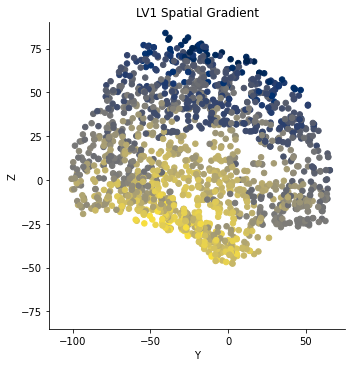

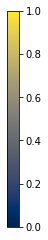

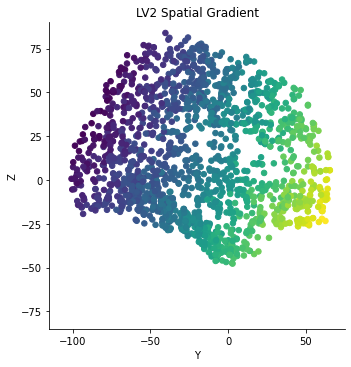

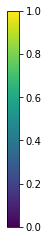

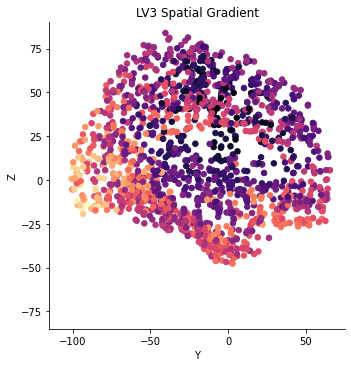

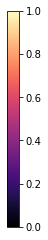

In [19]:
# Inspect the new "cortical" components

# Get transformed latent X and Y variables
tfm_X,tfm_Y = pls_mod.transform(pca_tfm, full_y)

# PLOT SPATIAL GRADIENTS (Latent Y variables)
pals = ['cividis','viridis','magma']

# for each component
for i in range(pls_mod.y_weights_.shape[0]):
    # colors
    cmap = sns.color_palette(pals[i],as_cmap=True)
    sg = tfm_Y[:,i]
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    gdf_CX.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))
    
    # plot
    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',  
                   data=gdf_CX, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='magma')
    
    # decorate
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('LV%s Spatial Gradient'%(i+1))
    plt.ylim(-85,90)
    plt.xlim(-115,75)
    plt.xticks([-100,-50,0,50])
    plt.yticks(list(range(-75,76,25)))
    #plt.savefig(os.path.join(fig_dir,'brain_plot_SpatialC%s_YZ.png'%(i+1)),
    #            bbox_inches='tight')

    # colorbar
    a = np.array([[0,1]])
    plt.figure(figsize=(.2, 5))
    img = plt.imshow(a, cmap=pals[i])
    plt.gca().set_visible(False)
    cax = plt.axes([0.1, 0.2, 0.8, 0.6])
    cbar = plt.colorbar(orientation="vertical", cax=cax)
    newticks = [round(norm.inverse(x),1) for x in cbar.get_ticks()]
    cbar.set_ticks(cbar.get_ticks())
    cbar.set_ticklabels(newticks)
#     plt.savefig(os.path.join(fig_dir,'brain_plot_component%s_cbar.png'%(i+1)),
#                                 bbox_inches='tight')

    plt.show()




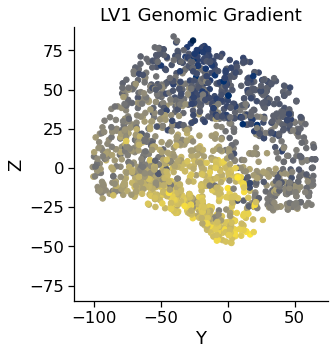

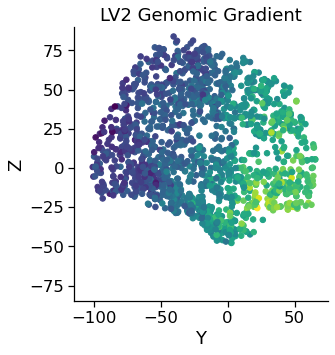

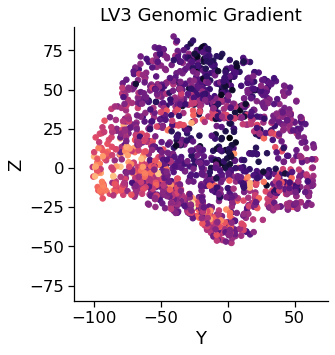

In [21]:
# now the genomic gradients (latent X variables)
sns.set_context('notebook',font_scale=1.5)

# for each component
for i in range(pls_mod.y_weights_.shape[0]):
    # colors
    cmap = sns.color_palette(pals[i],as_cmap=True)
    sg = tfm_X[:,i]
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    # plot
    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',  
                   data=gdf_CX, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  )
    
    # decorate
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('LV%s Genomic Gradient'%(i+1))
    plt.ylim(-85,90)
    plt.xlim(-115,75)
    plt.xticks([-100,-50,0,50])
    plt.yticks(list(range(-75,76,25)))
    #plt.savefig(os.path.join(fig_dir,'brain_plot_GenomicC%s_YZ.png'%(i+1)),bbox_inches='tight')



In [24]:
from importlib import reload
reload(hap)

<module 'HAP_Utils' from '/Users/ja8870vo/git/Vogel_PLS_Tx-Space/../Hippocampus_AP_Axis/HAP_Utils.py'>

In [22]:
# Save these to niftis so as to make surface renders

input_coords = []
for i,row in gdf_CX.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
wdir = './outputs/'
if not os.path.isdir(wdir):
    os.mkdir(wdir)

for i in range(pls_mod.y_weights_.shape[0]):
    #nm = 'c%s_CX'%(i+1)
    nm = 'c%s_CX_noSubCort'%(i+1)
    print('working on',nm)
    mni_pth = './data/MNI152_T1_1mm.nii.gz'
    gcx_img = hap.make_expression_image(tfm_X[:,i], input_coords, mni_pth, 
                                        wdir, nm, 5, return_img=False)
    

working on c1_CX_noSubCort
working on c2_CX_noSubCort
working on c3_CX_noSubCort


# Make surface images

In [23]:
#wb_command = 'wb_command'

## in case you don't have an alias for wbcommand, put the path to it here
## example: 
wb_command = '/Users/ja8870vo/Science/Other/workbench/bin_macosx64/wb_command'

In [ ]:
# #C1
# os.system('gunzip surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii.gz')

# cmd = '%s -volume-to-surface-mapping outputs/c1_CX_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C1_CX_Smth0mm_gc.func.gii -enclosing'%wb_command
# os.system(cmd)
# cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C1_CX_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C1_CX_Smth0mm_surf5mm_gc.func.gii'%wb_command
# os.system(cmd)
# #C2
# cmd = '%s -volume-to-surface-mapping outputs/c2_CX_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C2_CX_Smth0mm_gc.func.gii -enclosing'%wb_command
# os.system(cmd)
# cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C2_CX_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C2_CX_Smth0mm_surf5mm_gc.func.gii'%wb_command
# os.system(cmd)
# #C3
# cmd = '%s -volume-to-surface-mapping outputs/c3_CX_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C3_CX_Smth0mm_gc.func.gii -enclosing'%wb_command
# os.system(cmd)
# cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C3_CX_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C3_CX_Smth0mm_surf5mm_gc.func.gii'%wb_command
# os.system(cmd)

In [24]:
#C1
os.system('gunzip surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii.gz')

cmd = '%s -volume-to-surface-mapping outputs/c1_CX_noSubCort_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C1_CX_noSubCort_Smth0mm_gc.func.gii -enclosing'%wb_command
os.system(cmd)
cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C1_CX_noSubCort_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C1_CX_noSubCort_Smth0mm_surf5mm_gc.func.gii'%wb_command
os.system(cmd)
#C2
cmd = '%s -volume-to-surface-mapping outputs/c2_CX_noSubCort_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C2_CX_noSubCort_Smth0mm_gc.func.gii -enclosing'%wb_command
os.system(cmd)
cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C2_CX_noSubCort_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C2_CX_noSubCort_Smth0mm_surf5mm_gc.func.gii'%wb_command
os.system(cmd)
#C3
cmd = '%s -volume-to-surface-mapping outputs/c3_CX_noSubCort_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C3_CX_noSubCort_Smth0mm_gc.func.gii -enclosing'%wb_command
os.system(cmd)
cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C3_CX_noSubCort_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C3_CX_noSubCort_Smth0mm_surf5mm_gc.func.gii'%wb_command
os.system(cmd)

gunzip: can't stat: surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii.gz (surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii.gz.gz): No such file or directory


0

# Load surface projections

In [ ]:
# wdir = './surf/'

# #load in files
# surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C1_CX_Smth0mm_surf5mm_gc.func.gii'))
# overlay1=surf_obj.darrays[0].data
# # shift making positive to have greater control over colorbar with nilearn. 
# # Otherwise will always be symmetric about 0

# overlay1CX=overlay1-np.min(overlay1)

# surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C2_CX_Smth0mm_surf5mm_gc.func.gii'))
# overlay2=surf_obj.darrays[0].data
# overlay2CX=overlay2-np.min(overlay2)

# surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C3_CX_Smth0mm_surf5mm_gc.func.gii'))
# overlay3=surf_obj.darrays[0].data
# overlay3CX=overlay3-np.min(overlay3)

In [ ]:
wdir = './surf/'

#load in files
surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C1_CX_noSubCort_Smth0mm_surf5mm_gc.func.gii'))
overlay1=surf_obj.darrays[0].data
# shift making positive to have greater control over colorbar with nilearn. 
# Otherwise will always be symmetric about 0

overlay1CX=overlay1-np.min(overlay1)

surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C2_CX_noSubCort_Smth0mm_surf5mm_gc.func.gii'))
overlay2=surf_obj.darrays[0].data
overlay2CX=overlay2-np.min(overlay2)

surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C3_CX_noSubCort_Smth0mm_surf5mm_gc.func.gii'))
overlay3=surf_obj.darrays[0].data
overlay3CX=overlay3-np.min(overlay3)

In [27]:
wdir = './surf/'

#load in files
surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C1_Smth0mm_surf5mm_gc.func.gii'))
overlay1=surf_obj.darrays[0].data
# shift making positive to have greater control over colorbar with nilearn. 
# Otherwise will always be symmetric about 0

overlay1=overlay1-np.min(overlay1)

surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C2_Smth0mm_surf5mm_gc.func.gii'))
overlay2=surf_obj.darrays[0].data
overlay2=overlay2-np.min(overlay2)

surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C3_Smth0mm_surf5mm_gc.func.gii'))
overlay3=surf_obj.darrays[0].data
overlay3=overlay3-np.min(overlay3)

In [28]:
surface = os.path.join(wdir,'fs_LR.32k.L.inflated.surf.gii.gz')

In [68]:
plotting.view_surf(surface,overlay1CX,
                   symmetric_cmap=False,cmap='magma',
                  )

In [32]:
plotting.view_surf(surface,overlay2CX,
                   symmetric_cmap=False,cmap='viridis',
                  )

In [69]:
plotting.view_surf(surface,overlay3CX,
                   symmetric_cmap=False,cmap='cividis',
                  )

# Correlate with the originals

r = 0.6213779708059208, rho = 0.6569835383896725, r2 = 0.3861105826028838


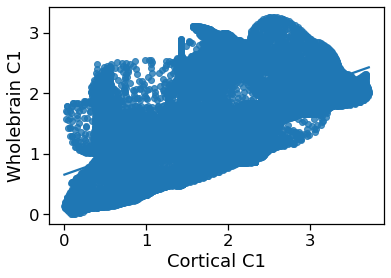

r = -0.3337108933825847, rho = -0.33057391550034154, r2 = 0.1113629603622028


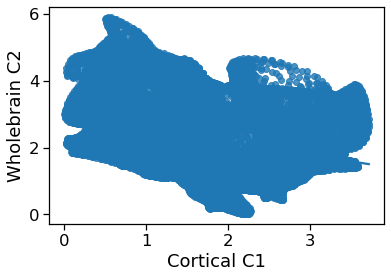

r = -0.6918524714624167, rho = -0.6582709374398636, r2 = 0.4786598422686541


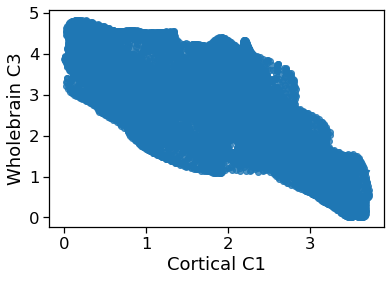

r = -0.26082138659810183, rho = -0.3056100923843737, r2 = 0.0680277957069565


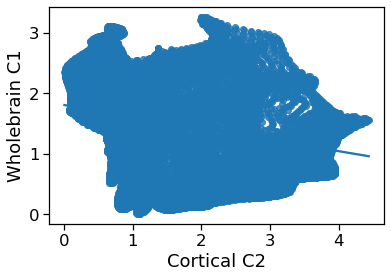

r = 0.886152656862035, rho = 0.8889231298205645, r2 = 0.7852665312636437


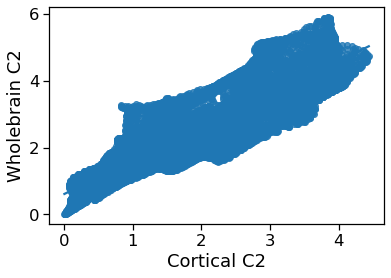

r = -0.5074795993509567, rho = -0.5349856761833106, r2 = 0.2575355437574075


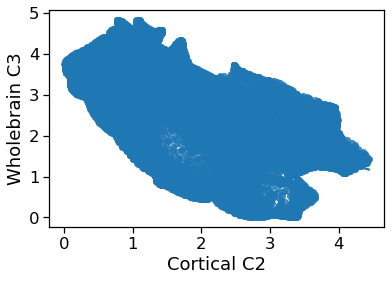

r = 0.7160752861652068, rho = 0.6540320614490851, r2 = 0.5127638154565828


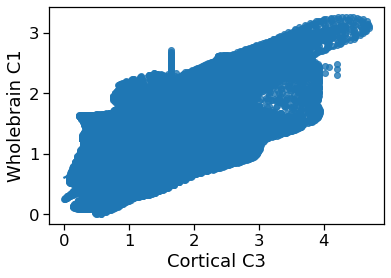

r = -0.0350346557590689, rho = -0.0978747134625289, r2 = 0.0012274271041564598


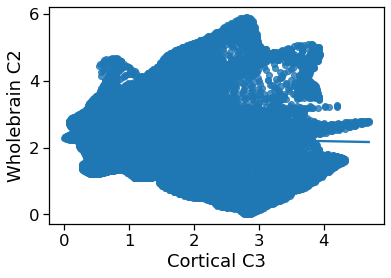

r = 0.15572321067927591, rho = 0.1459092971771078, r2 = 0.024249718344262153


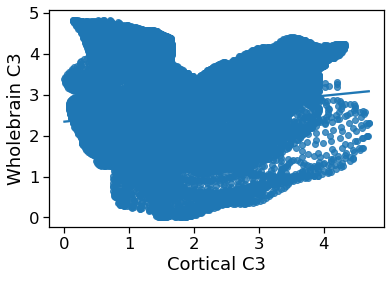

In [34]:
for i,x in enumerate([overlay1CX,overlay2CX,overlay3CX]):
    for c in range(1,4):
        surf_obj = nb.load(os.path.join(wdir,'PLS_Volume_C%s_Smth0mm_surf5mm_gc.func.gii'%c))
        jnk = surf_obj.darrays[0].data
        jnk = jnk - np.min(jnk)
        sns.regplot(x=x,y=jnk)
        plt.xlabel('Cortical C%s'%(i+1))
        plt.ylabel('Wholebrain C%s'%c)
        r,p = stats.pearsonr(x,jnk)
        rho,rhop = stats.spearmanr(x,jnk)
        print('r = %s, rho = %s, r2 = %s'%(r,rho,r**2))
        plt.show()
    

In [35]:
jnk = []
for x in [overlay1,overlay2,overlay3,
                    overlay1CX,overlay2CX,overlay3CX]:
    jnk.append(pandas.Series(x))
jnk = pandas.concat(jnk,axis=1)
jnk.columns = ['LV1_WB','LV2_WB','LV3_WB','LV1_CX','LV2_CX','LV3_CX']

saving


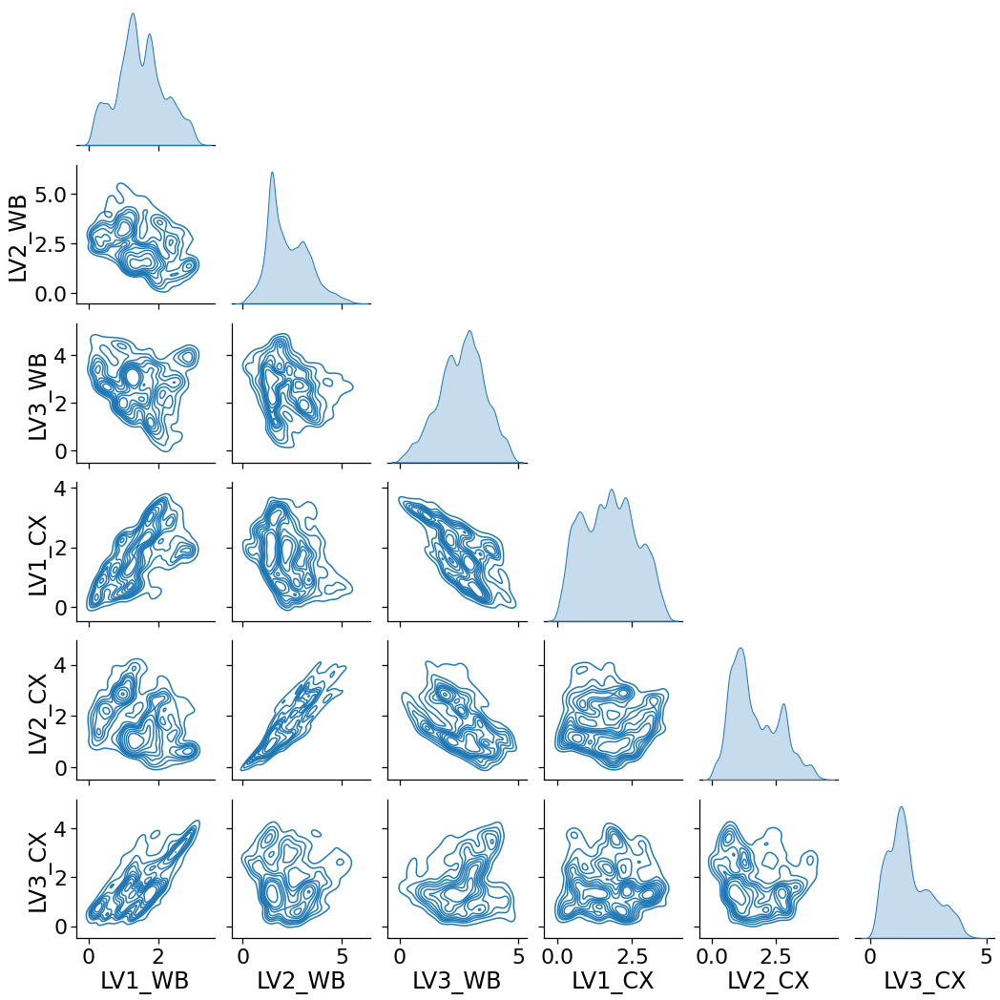

In [36]:
sns.set_context('notebook',font_scale=2)
sns.pairplot(jnk,kind='kde',corner=True)
print('saving')
# plt.savefig('/Users/ja8870vo/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/PNASRevision/PairPlot_CXvWB.pdf',
#            bbox_inches='tight')
plt.savefig('/Users/ja8870vo/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/PNASRevision/PairPlot_CXvWB_noSubCort.pdf',
           bbox_inches='tight')

# Make a vertex-wide atlas of gradient interactions

In [6]:
0.023 * 1500

34.5

In [37]:
# make the data into a vertex x component matrix

from sklearn.preprocessing import MinMaxScaler
surfmat = np.concatenate([overlay1CX.reshape(-1,1),
                          overlay2CX.reshape(-1,1),
                          overlay3CX.reshape(-1,1)],
              axis=1)
rgb_conv = MinMaxScaler().fit_transform(surfmat).round(3)

In [48]:
# run hierarchichal agglomerative clustering with k=2-15, and
# save cluster evaluation metrics
csol = pandas.DataFrame()
for i,k in enumerate(range(2,15)):
    print('working on k =',k)
    d = rgb_conv
    cluster = AgglomerativeClustering(n_clusters=k, affinity='euclidean', 
                                  linkage='ward')
    cluster.fit_predict(d)
    csol.loc[i,'k'] = k
    csol.loc[i,'sil_score'] = silhouette_score(d,cluster.labels_,random_state=123)
    csol.loc[i,'ch_score'] = calinski_harabasz_score(d,cluster.labels_)

working on k = 2


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 3


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 4


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 5


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 6


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 7


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 8


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 9


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 10


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 11


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 12


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 13


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


working on k = 14


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


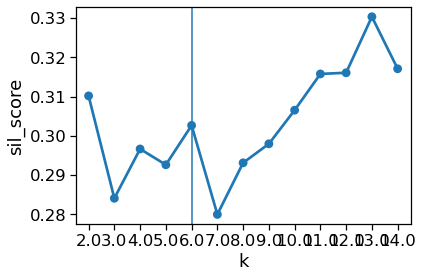

In [92]:
sns.pointplot(x='k',y='sil_score',data=csol)
plt.axvline(4)

<AxesSubplot:xlabel='k', ylabel='ch_score'>

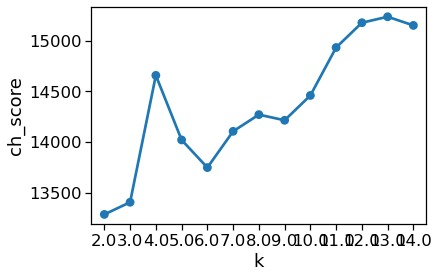

In [50]:
sns.pointplot(x='k',y='ch_score',data=csol)

In [38]:
cluster = AgglomerativeClustering(n_clusters=6, affinity='euclidean', 
                                  linkage='ward')
cluster.fit_predict(rgb_conv)
labs = cluster.labels_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


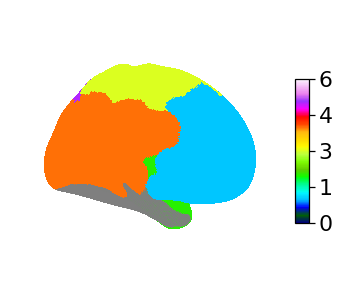

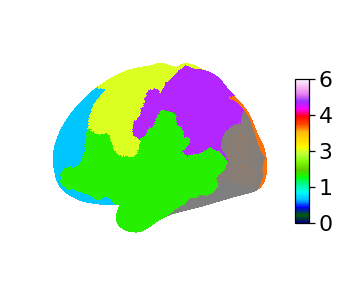

In [40]:
fig_dir = '/Users/ja8870vo/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/PNASRevision/'

# visualize clusters
plotting.plot_surf_roi(surface,labs,cmap='gist_ncar',
                      colorbar=True,view='medial')
# plt.savefig(os.path.join(fig_dir,'CTX_Atlas_Lat.pdf'),
#            bbox_inches='tight')
plt.savefig(os.path.join(fig_dir,'CTX_NoSubCort_Atlas_Lat.pdf'),
           bbox_inches='tight')
plt.show()
plotting.plot_surf_roi(surface,labs,cmap='gist_ncar',
                      colorbar=True,view='lateral')
# plt.savefig(os.path.join(fig_dir,'CTX_Atlas_Med.pdf'),
#            bbox_inches='tight')
plt.savefig(os.path.join(fig_dir,'CTX_NoSubCort_Med.pdf'),
           bbox_inches='tight')
plt.show()

In [41]:
# a bunch of brain features in Glasser atlas from Sydnor et al., 2021 Neuron
featdf = pandas.read_csv('./data/stat_maps.csv')
glasser = pandas.read_csv('./surf/glasser_vector.csv', header = None)
glasser = np.array(glasser[0].values)
glabs = pandas.read_csv('./surf/glasser_labels.csv', header=None)

In [42]:
# Let's load up a mapping of Glasser parcellation to lobes
glabs2 = pandas.read_csv('data/GlasserLobeMapping.csv')
for i,row in glabs2.iterrows():
    roi = 'Right_'+row['Glasser ROI']
    ind = glabs[glabs[0]==roi].index
    featdf.loc[ind,'Lobe'] = row['Lobe']
    featdf.loc[ind,'Lobelabel'] = row['Lobe(#)']

In [43]:
glasser.shape

(59412,)

In [44]:
mwlh = pandas.read_csv('./surf/medialwall_mask_LH.csv',
                      header=None)
mwrh = pandas.read_csv('./surf/medialwall_mask_RH.csv',
                      header=None)
mwfull = pandas.concat([mwlh,mwrh])
mwfull.shape

garr = np.zeros(mwfull.shape[0])
boolarr = mwfull[0].values

garr[boolarr] = glasser
garrlh = garr[:len(mwlh)]
glasser = garrlh.astype(int)

In [45]:
# move the gradients clusters to glasser rois using winner-takes-all
glassified = np.zeros(len(np.unique(glasser))-1)
gfied_surf = np.zeros_like(glasser)
for i,parc in enumerate(np.unique(glasser)):
    if parc==0: continue
    a=labs[glasser==parc]
    counts = np.bincount(a)
    winner = np.argmax(counts)
    glassified[i-1] = winner
    gfied_surf[glasser==parc] = winner+1

In [46]:
featdf.loc[:,'CXparcels'] = glassified

In [47]:
# Let's load up a mapping of Glasser parcellation to lobes
glabs2 = pandas.read_csv('data/GlasserLobeMapping.csv')
for i,row in glabs2.iterrows():
    roi = 'Right_'+row['Glasser ROI']
    ind = glabs[glabs[0]==roi].index
    featdf.loc[ind,'Lobe'] = row['Lobe']
    featdf.loc[ind,'Lobelabel'] = row['Lobe(#)']

CXparcels


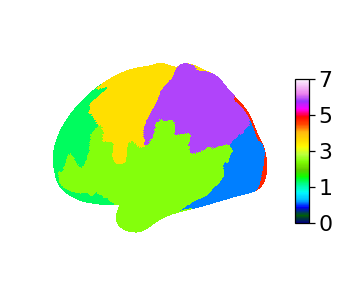

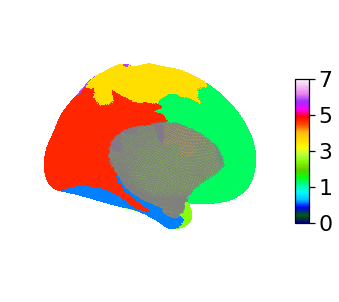

In [48]:
# project lobes and molecular territories
roikey = dict(zip(range(len(featdf)),np.unique(glasser)[1:]))
for feat in ['CXparcels']:
    print(feat)
    vals_tfm = (featdf.loc[:,feat].values + 1).reshape(-1,1)[:,0]
    dat = np.zeros_like(glasser).astype(float)
    for i in glabs2.index:
        dat[glasser==roikey[(i)]] = vals_tfm[i]
    plotting.plot_surf_roi(surface,dat,cmap='gist_ncar',
                      colorbar=True,view='lateral')
#     plt.savefig(os.path.join(fig_dir,'CTX_Atlas_Lat.pdf'),
#                bbox_inches='tight')
    plt.savefig(os.path.join(fig_dir,'CTX_NoSubCort_Atlas_Lat.pdf'),
               bbox_inches='tight')
    plt.show()
    
    plotting.plot_surf_roi(surface,dat,cmap='gist_ncar',
                      colorbar=True,view='medial')
#     plt.savefig(os.path.join(fig_dir,'CTX_Atlas_Med.pdf'),
#                bbox_inches='tight')
    plt.savefig(os.path.join(fig_dir,'CTX_NoSubCort_Atlas_Med.pdf'),
               bbox_inches='tight')
    plt.show()

In [50]:
adjusted_mutual_info_score(featdf.Lobelabel.values,featdf.CXparcels.values)

0.4439851588417562

In [51]:
adjusted_rand_score(featdf.Lobelabel.values,featdf.CXparcels.values)

0.2928277292303041

# Compare CTX only and WB in associations

In [52]:
featdf = pandas.read_csv('data/featdf.csv',index_col=0)
featdf.head()

,asl,glasser_CMRO2,glasser_CMRGlu,glasser_CBV,glasser_CBF,hill.evo_remapped,hill.dev_remapped,glasser_GI,x,y,...,meggamma2,megtheta,megtimescale,parcels,MargGrad1,MargGrad2,MargGrad3,WB_TxGrad1,WB_TxGrad2,WB_TxGrad3
0,60.957941,6208.330024,7192.999163,7021.067584,6764.111842,-1.726372,-0.064093,-0.527573,10.0783,84.1594,...,0.009182,0.217586,14.223835,4.0,-3.064218,3.245429,-0.640204,2.886094,1.375765,3.909106
1,65.351692,5251.602564,6392.635897,4377.146154,5597.215385,0.425741,0.011095,-0.131119,44.7355,67.2897,...,0.009475,0.232885,14.995714,2.0,-4.149796,4.342772,-1.290663,1.908172,0.995212,2.833915
2,57.549976,5615.993976,6721.081928,5117.877108,6088.228313,-1.233178,-0.112511,-0.258508,15.1020,79.0827,...,0.007796,0.210615,12.588691,2.0,-4.440913,4.180874,-1.136683,1.810074,0.801639,3.571070
3,58.665535,5903.808799,6955.820333,7459.245541,6408.234364,-1.404349,-0.113119,-0.383811,12.0440,82.0592,...,0.009305,0.214396,13.867819,4.0,-4.020367,4.315156,-1.059088,2.693766,1.027651,3.869033
4,58.220830,5503.739766,6697.582066,6514.306823,6026.794152,-1.184210,-0.093505,-0.141583,16.6067,84.7934,...,0.009849,0.211015,13.365623,4.0,-3.837535,4.339931,-0.944915,2.473458,0.707742,3.646096


In [53]:
glasser = pandas.read_csv('./surf/glasser_vector.csv', header = None)
glasser = np.array(glasser[0].values)
glabs = pandas.read_csv('./surf/glasser_labels.csv', header=None)

mwlh = pandas.read_csv('./surf/medialwall_mask_LH.csv',
                      header=None)
mwrh = pandas.read_csv('./surf/medialwall_mask_RH.csv',
                      header=None)
mwfull = pandas.concat([mwlh,mwrh])

garr = np.zeros(mwfull.shape[0])
boolarr = mwfull[0].values

garr[boolarr] = glasser
garrlh = garr[:len(mwlh)]

glasser = garrlh.astype(int)

In [54]:
# separately obtain glasser ROI values for each of the 3 cortical gradients
for c,olay in {1:overlay1CX,2:overlay2CX,3:overlay3CX}.items():
    for i,lab in enumerate(np.unique(glasser)[1:]):
        featdf.loc[i,'CX_TxGrad%s'%c] = np.mean(olay[glasser==lab])

In [55]:
# sub-select features of interest
# All maps from Sydnor et al., 2021 Neuron
#    * except fMRI gradient because we're using it as an IV
#    * plus the cog map from Hansen et al., 2021 Nat Hum Beh
#    * plus geometric distance (e.g. from Margulies et al., 2016 PNAS)
cols = ['T1T2','hill.evo_remapped','hill.dev_remapped','allom','CBF','PC1_neurosynth',
       'externopyramidisation','glasser_GI','thickness','PC1_AHBA','hansen','geodist',
       'megtimescale']

In [56]:
# give them better names
cnames = dict(zip(cols,
                 ['T1/T2','EvoExp','DevExp','AlloScal','CBF','Neurosynth-PC1',
                 'ExternPyr','AerGlyc','CortThx','AHBA-PC1','Hansen2021','GeoDist',
                 'MEG TS']))

In [57]:

# Make a version of the df and feature names that 
# statsmodels won't complain about
featdf2 = pandas.DataFrame(featdf,copy=True)
newcols = [cnames[x] if x in cnames.keys() else x for x in featdf2.columns]
newcols = [x.replace('-','').replace('/','').replace('.','') for x in featdf2.columns]
cnames2 = dict(zip(featdf.columns,newcols))
featdf2.columns = newcols

# store results
regr = pandas.DataFrame()
count=0
conds = ['WB','CX','BothWB','BothCX']
# for each feature
for feat in cols:
    for cond in conds:
        # just fmri gradients as regressors
        if cond=='WB':
            mod = smf.ols('%s ~ WB_TxGrad1 + WB_TxGrad2 + WB_TxGrad3'%cnames2[feat],data=featdf2).fit()
        # just Tx Components as regressors    
        elif cond == 'CX':
            mod = smf.ols('%s ~ CX_TxGrad1 + CX_TxGrad2 + CX_TxGrad3'%cnames2[feat],data=featdf2).fit()
        elif cond == 'BothWB':
            mod = smf.ols('%s ~ WB_TxGrad1 + WB_TxGrad2 + WB_TxGrad3 + MargGrad1 + MargGrad2 + MargGrad3'%cnames2[feat],
                          data=featdf2).fit()
        elif cond == 'BothCX':
            mod = smf.ols('%s ~ CX_TxGrad1 + CX_TxGrad2 + CX_TxGrad3 + MargGrad1 + MargGrad2 + MargGrad3'%cnames2[feat],
                          data=featdf2).fit()
        # store name and full model r square
        regr.loc[count,'y'] = cnames[feat]
        regr.loc[count,'cond'] = cond
        regr.loc[count,'r2'] = mod.rsquared
        count += 1

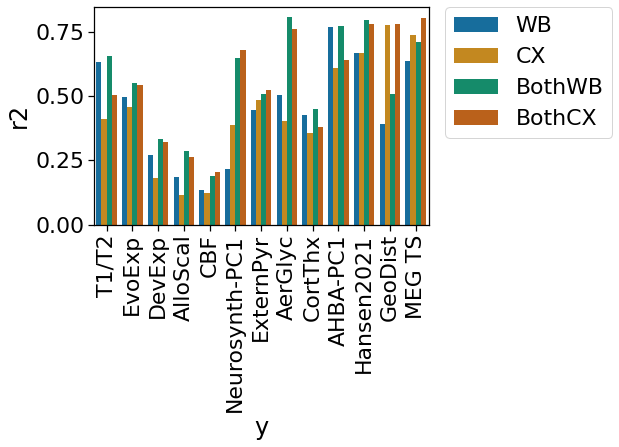

In [58]:
# results
g = sns.barplot(x='y',y='r2',hue='cond',data=regr,palette='colorblind')
g.set_xticklabels(g.get_xticklabels(),rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [59]:
catch = []
n_iter = 100 # 100 bootstrap samples
conds = ['WB','CX']
for i in range(n_iter):
    # keep track
    if i % 10 == 0: print('working on %s of %s'%((i+1),n_iter))
    # make a random bootstrap sample of the parcels
    rand = np.random.RandomState(123+i)
    samp = rand.choice(featdf2.index,len(featdf2.index),replace=True)
    Bfeats = pandas.DataFrame(featdf2.loc[samp],copy=True)
    Bregr = pandas.DataFrame()
    # run the model
    count=0
    for feat in cols:
        for cond in conds:
            if cond=='WB':
                mod = smf.ols('%s ~ WB_TxGrad1 + WB_TxGrad2 + WB_TxGrad3'%cnames2[feat],data=Bfeats).fit()
            elif cond == 'CX':
                mod = smf.ols('%s ~ CX_TxGrad1 + CX_TxGrad2 + CX_TxGrad3'%cnames2[feat],data=Bfeats).fit()
            Bregr.loc[count,'y'] = cnames[feat]
            Bregr.loc[count,'cond'] = cond
            Bregr.loc[count,'r2'] = mod.rsquared
            count += 1
    Bregr.loc[:,'iter'] = i
    catch.append(Bregr) # store results

working on 1 of 100
working on 11 of 100
working on 21 of 100
working on 31 of 100
working on 41 of 100
working on 51 of 100
working on 61 of 100
working on 71 of 100
working on 81 of 100
working on 91 of 100


In [60]:
Bregr = pandas.concat(catch) # put it all together

In [61]:
# order plots by r2 of molecular gradient

# order = jnk[jnk.cond=='Tx'].sort_values('r2',ascending=False).y.values
order = Bregr[Bregr.cond=='WB'].groupby('y').mean().sort_values('r2',
                                                        ascending=False
                                                       ).index

In [62]:
order

Index(['AHBA-PC1', 'Hansen2021', 'T1/T2', 'MEG TS', 'AerGlyc', 'EvoExp',
       'ExternPyr', 'CortThx', 'GeoDist', 'DevExp', 'Neurosynth-PC1',
       'AlloScal', 'CBF'],
      dtype='object', name='y')

In [63]:
## CAREFUL!! The label ordering for a few of these can change if you change the random
## seed for the bootstrap. Make sure it's correct!
even_cleaner_labels = ['AHBA-PC1','Tx/Cog PLSY','Tw1/T2w Ratio','MEG Timescale',
                      'Aer. Glyc.','Evo. Exp.','Externopyr.',
                       'Cort. Thx','Geo. Distance','Dev. Exp.','Neurosynth-PCA',
                        'Allo. Scaling','CBF',]

In [64]:
nregr = pandas.DataFrame(regr,copy=True)
nregr.drop(nregr[nregr.cond.isin(['BothWB','BothCX'])].index,inplace=True)

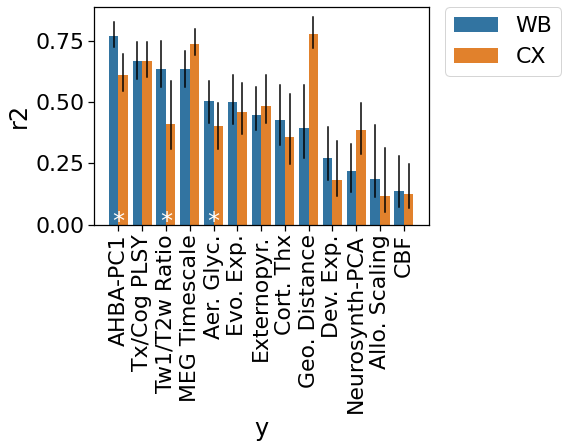

In [67]:
# now lets compare the results from each of the models to a model using both Tx and fMRI gradients

# results
g = sns.barplot(x='y',y='r2',hue='cond',data=nregr,order=order)
g.set_xticklabels(even_cleaner_labels,rotation=90)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# CIs from bootstrap
for i,feat in enumerate(order):
    for cond,xloc in dict(zip(['WB','CX'],[-0.2,0.2])).items():
        distr = sorted(Bregr[(Bregr.cond==cond) & \
                             (Bregr['y']==feat)].r2.values)
#         mn = Bregr[(regr.cond==cond) & \
#                              (regr['y']==feat)].r2.values[0]
        hi = distr[-2]
        lo = distr[3]
        plt.plot([i+xloc,i+xloc],[lo,hi],c='k')

#    significance testing
    distr1 = sorted(Bregr[(Bregr.cond=='WB') & (Bregr['y']==feat)].r2.values)
    distr2 = sorted(Bregr[(Bregr.cond=='CX') & (Bregr['y']==feat)].r2.values)
    hilo = distr1[2]
    lohi = np.mean(distr2)
    if hilo > lohi:
        plt.text(i,0.01,'*',c='white',va='center',ha='center')
plt.savefig(os.path.join(fig_dir,'MGvFGvALL_Barplot_CXvWB_NoSubCort.pdf'),
           bbox_inches='tight')